# DamageLens: Car Parts Instance Segmentation with Mask R-CNN

This notebook trains and evaluates Mask R-CNN ResNet50-FPN v2 on the processed Car Parts dataset.

The model predicts:

- Vehicle-part class
- Bounding box
- Instance segmentation mask

The processed COCO dataset contains 14 foreground classes. Mask R-CNN will therefore use 15 classes after including the required background class.

## Environment setup

Import the libraries required for dataset loading, visualization and model training.

In [1]:
import json
import platform
import random
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torchvision
from PIL import Image

## Runtime information

Confirm the Python, PyTorch and Torchvision versions and verify that CUDA is available.

In [2]:
runtime_info = {
    "Python": sys.version.split()[0],
    "PyTorch": torch.__version__,
    "Torchvision": torchvision.__version__,
    "CUDA available": torch.cuda.is_available(),
    "CUDA version": torch.version.cuda,
    "Platform": platform.platform(),
}

pd.Series(runtime_info, name="value")

Python                              3.11.15
PyTorch                        2.11.0+cu128
Torchvision                    0.26.0+cu128
CUDA available                         True
CUDA version                           12.8
Platform          Windows-10-10.0.26200-SP0
Name: value, dtype: object

In [3]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

if DEVICE.type == "cuda":
    print(f"Device: {torch.cuda.get_device_name(0)}")
    print(f"VRAM: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.1f} GB")
else:
    print("Device: CPU")

Device: NVIDIA GeForce RTX 4070 Laptop GPU
VRAM: 8.0 GB


## Reproducibility

Use a fixed random seed for data sampling, augmentation and model initialization.

In [4]:
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

## Project paths

Resolve the repository root from the notebook location and point to the processed Car Parts dataset.

In [5]:
search_paths = [Path.cwd(), *Path.cwd().parents]
PROJECT_ROOT = next(path for path in search_paths if (path / ".git").exists())

DATA_ROOT = PROJECT_ROOT / "data" / "processed" / "car_parts"
OUTPUT_ROOT = PROJECT_ROOT / "outputs" / "part_segmentation" / "mask_rcnn"
CHECKPOINT_ROOT = OUTPUT_ROOT / "checkpoints"

print(f"Project root: {PROJECT_ROOT}")
print(f"Dataset root: {DATA_ROOT}")
print(f"Output root:  {OUTPUT_ROOT}")

Project root: e:\Projects\DamageLens
Dataset root: e:\Projects\DamageLens\data\processed\car_parts
Output root:  e:\Projects\DamageLens\outputs\part_segmentation\mask_rcnn


## Processed dataset discovery

Locate the COCO annotation files and count the available images without assuming a particular annotation filename.

In [6]:
IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
SPLITS = ("train", "validation", "test")

dataset_paths = []

for split in SPLITS:
    split_root = DATA_ROOT / split
    images = [path for path in split_root.rglob("*") if path.suffix.lower() in IMAGE_EXTENSIONS]
    annotations = list(split_root.rglob("*.json"))

    dataset_paths.append({
        "split": split,
        "split_found": split_root.is_dir(),
        "images": len(images),
        "annotation_files": len(annotations),
        "annotation_paths": [str(path.relative_to(PROJECT_ROOT)) for path in annotations],
    })

dataset_paths = pd.DataFrame(dataset_paths)
dataset_paths

,split,split_found,images,annotation_files,annotation_paths
0,train,True,6390,1,[data\processed\car_parts\train\_annotations.c...
1,validation,True,1747,1,[data\processed\car_parts\validation\_annotati...
2,test,True,946,1,[data\processed\car_parts\test\_annotations.co...


## COCO annotation paths

Associate each split with its image directory and COCO annotation file.

In [7]:
IMAGE_DIRS = {split: DATA_ROOT / split for split in SPLITS}
ANNOTATION_PATHS = {
    split: next(IMAGE_DIRS[split].glob("*.json"))
    for split in SPLITS
}

pd.DataFrame({
    "split": SPLITS,
    "image_directory": [IMAGE_DIRS[split] for split in SPLITS],
    "annotation_file": [ANNOTATION_PATHS[split] for split in SPLITS],
})

,split,image_directory,annotation_file
0,train,e:\Projects\DamageLens\data\processed\car_part...,e:\Projects\DamageLens\data\processed\car_part...
1,validation,e:\Projects\DamageLens\data\processed\car_part...,e:\Projects\DamageLens\data\processed\car_part...
2,test,e:\Projects\DamageLens\data\processed\car_part...,e:\Projects\DamageLens\data\processed\car_part...


## Category definitions

Verify that category identifiers and names are consistent across the train, validation and test splits.

In [8]:
category_tables = {}

for split, annotation_path in ANNOTATION_PATHS.items():
    with annotation_path.open(encoding="utf-8") as file:
        coco_data = json.load(file)

    category_tables[split] = pd.DataFrame(coco_data["categories"])[["id", "name"]].sort_values("id")

pd.concat(category_tables, names=["split"]).reset_index(level=0)

,split,id,name
0,train,1,Bonnet
1,train,2,Frontbumper
2,train,3,Frontdoor
3,train,4,Frontfender
4,train,5,Headlights
5,train,6,Rearbumper
6,train,7,Reardoor
7,train,8,Rearfender
8,train,9,Rearlamp
9,train,10,Rockerpanel


In [9]:
reference_categories = category_tables["train"].reset_index(drop=True)

categories_consistent = all(
    table.reset_index(drop=True).equals(reference_categories)
    for table in category_tables.values()
)

assert categories_consistent, "Category definitions differ between splits."
reference_categories

,id,name
0,1,Bonnet
1,2,Frontbumper
2,3,Frontdoor
3,4,Frontfender
4,5,Headlights
5,6,Rearbumper
6,7,Reardoor
7,8,Rearfender
8,9,Rearlamp
9,10,Rockerpanel


## Model label mapping

Map the COCO category identifiers to contiguous model labels. Background remains label 0.

In [10]:
CATEGORY_TO_LABEL = {
    category_id: label
    for label, category_id in enumerate(reference_categories["id"], start=1)
}

LABEL_TO_CATEGORY = {
    label: category_id
    for category_id, label in CATEGORY_TO_LABEL.items()
}

LABEL_TO_NAME = {
    CATEGORY_TO_LABEL[row.id]: row.name
    for row in reference_categories.itertuples()
}

NUM_CLASSES = len(CATEGORY_TO_LABEL) + 1

print(f"Foreground classes: {len(CATEGORY_TO_LABEL)}")
print(f"Classes including background: {NUM_CLASSES}")

Foreground classes: 14
Classes including background: 15


## Image transforms

Convert images to floating-point tensors in the `[0, 1]` range. Training images receive a random horizontal flip that is also applied to their boxes and masks.

In [11]:
from torchvision.transforms import v2

def build_transforms(training=False):
    transforms = []

    if training:
        transforms.append(v2.RandomHorizontalFlip(p=0.5))

    transforms.extend([
        v2.ToDtype(torch.float32, scale=True),
        v2.ToPureTensor(),
    ])

    return v2.Compose(transforms)

## COCO instance dataset

Load each image with its bounding boxes, class labels, segmentation masks, areas and crowd indicators.

In [12]:
from pycocotools.coco import COCO
from torch.utils.data import Dataset
from torchvision import tv_tensors

In [13]:
class CocoInstanceDataset(Dataset):
    def __init__(self, image_dir, annotation_path, category_to_label, transforms=None):
        self.image_dir = Path(image_dir)
        self.coco = COCO(str(annotation_path))
        self.image_ids = sorted(self.coco.getImgIds())
        self.category_to_label = category_to_label
        self.transforms = transforms

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, index):
        image_id = self.image_ids[index]
        image_info = self.coco.loadImgs(image_id)[0]
        image = Image.open(self.image_dir / image_info["file_name"]).convert("RGB")

        annotation_ids = self.coco.getAnnIds(imgIds=[image_id])
        annotations = self.coco.loadAnns(annotation_ids)
        #target = self._build_target(image_id, image_info, annotations)
        target = build_coco_target(self, image_id, image_info, annotations)

        image = tv_tensors.Image(image)

        if self.transforms:
            image, target = self.transforms(image, target)

        return image, target

In [14]:
def build_coco_target(dataset, image_id, image_info, annotations):
    width, height = image_info["width"], image_info["height"]

    boxes = [
        [x, y, x + box_width, y + box_height]
        for x, y, box_width, box_height in (annotation["bbox"] for annotation in annotations)
    ]

    labels = [
        dataset.category_to_label[annotation["category_id"]]
        for annotation in annotations
    ]

    masks = [
        dataset.coco.annToMask(annotation)
        for annotation in annotations
    ]

    target = {
        "boxes": tv_tensors.BoundingBoxes(
            torch.as_tensor(boxes, dtype=torch.float32).reshape(-1, 4),
            format="XYXY",
            canvas_size=(height, width),
        ),
        "labels": torch.as_tensor(labels, dtype=torch.int64),
        "masks": tv_tensors.Mask(
            torch.as_tensor(np.array(masks), dtype=torch.uint8).reshape(-1, height, width)
        ),
        "image_id": torch.tensor(image_id, dtype=torch.int64),
        "area": torch.as_tensor(
            [annotation["area"] for annotation in annotations],
            dtype=torch.float32,
        ),
        "iscrowd": torch.as_tensor(
            [annotation.get("iscrowd", 0) for annotation in annotations],
            dtype=torch.int64,
        ),
    }

    return target

## Dataset instances

Create training, validation and test datasets with augmentation enabled only for training.


In [15]:
datasets = {
    split: CocoInstanceDataset(
        image_dir=IMAGE_DIRS[split],
        annotation_path=ANNOTATION_PATHS[split],
        category_to_label=CATEGORY_TO_LABEL,
        transforms=build_transforms(training=split == "train"),
    )
    for split in SPLITS
}

pd.Series({split: len(dataset) for split, dataset in datasets.items()}, name="images")

loading annotations into memory...
Done (t=1.09s)
creating index...
index created!
loading annotations into memory...
Done (t=0.30s)
creating index...
index created!
loading annotations into memory...
Done (t=0.15s)
creating index...
index created!


train         6390
validation    1747
test           946
Name: images, dtype: int64

## Sample target validation

Load one training sample and verify its tensor shapes, types and value range.

In [16]:
sample_image, sample_target = datasets["train"][0]

sample_summary = {
    "image shape": tuple(sample_image.shape),
    "image dtype": sample_image.dtype,
    "image minimum": sample_image.min().item(),
    "image maximum": sample_image.max().item(),
    "instances": len(sample_target["labels"]),
    "boxes shape": tuple(sample_target["boxes"].shape),
    "masks shape": tuple(sample_target["masks"].shape),
}

pd.Series(sample_summary)

image shape      (3, 600, 800)
image dtype      torch.float32
image minimum              0.0
image maximum              1.0
instances                    4
boxes shape             (4, 4)
masks shape      (4, 600, 800)
dtype: object

In [17]:
assert sample_image.ndim == 3 and sample_image.shape[0] == 3
assert sample_image.dtype == torch.float32
assert 0 <= sample_image.min() <= sample_image.max() <= 1
assert len(sample_target["boxes"]) == len(sample_target["labels"])
assert len(sample_target["masks"]) == len(sample_target["labels"])

print("Sample target passed validation.")

Sample target passed validation.


## Annotation visualization

Overlay instance masks, bounding boxes and part labels on randomly selected training images.

In [18]:
from torchvision.utils import draw_bounding_boxes, draw_segmentation_masks

COLORS = [
    "red", "lime", "blue", "yellow", "magenta", "cyan", "orange",
    "purple", "pink", "gold", "deepskyblue", "springgreen", "salmon", "white",
]

In [19]:
def render_annotations(image, target):
    rendered = (image * 255).to(torch.uint8)
    labels = target["labels"].tolist()
    colors = [COLORS[label - 1] for label in labels]
    names = [LABEL_TO_NAME[label] for label in labels]

    rendered = draw_segmentation_masks(
        rendered,
        masks=target["masks"].bool(),
        alpha=0.45,
        colors=colors,
    )

    return draw_bounding_boxes(
        rendered,
        boxes=target["boxes"],
        labels=names,
        colors=colors,
        width=2,
        font_size=14,
    )

c:\Users\ppava\anaconda3\envs\damagelens\Lib\site-packages\torchvision\utils.py:375: UserWarning: Argument 'font_size' will be ignored since 'font' is not set.
  warnings.warn("Argument 'font_size' will be ignored since 'font' is not set.")


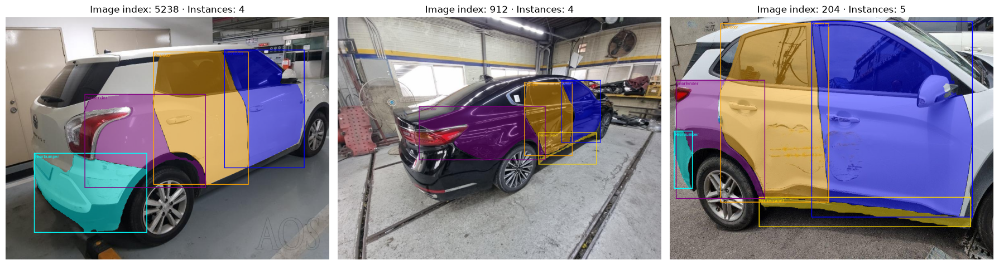

In [20]:
sample_indices = random.Random(SEED).sample(range(len(datasets["train"])), 3)

fig, axes = plt.subplots(1, 3, figsize=(18, 7))

for axis, index in zip(axes, sample_indices):
    image, target = datasets["train"][index]
    rendered = render_annotations(image, target)

    axis.imshow(rendered.permute(1, 2, 0))
    axis.set_title(f"Image index: {index} · Instances: {len(target['labels'])}")
    axis.axis("off")

plt.tight_layout()

## Data loaders

Create loaders that return lists of images and annotation dictionaries. Start with zero worker processes for stable execution inside a Windows notebook.

In [21]:
from torch.utils.data import DataLoader

def collate_batch(batch):
    return tuple(zip(*batch))

In [22]:
BATCH_SIZE = 16
NUM_WORKERS = 0

data_loaders = {
    split: DataLoader(
        dataset,
        batch_size=BATCH_SIZE,
        shuffle=split == "train",
        num_workers=NUM_WORKERS,
        pin_memory=torch.cuda.is_available(),
        collate_fn=collate_batch,
    )
    for split, dataset in datasets.items()
}



## Batch validation

Load one training batch and confirm that variable image dimensions and instance counts are preserved.

In [23]:
batch_images, batch_targets = next(iter(data_loaders["train"]))

batch_summary = [
    {
        "batch_position": position,
        "image_shape": tuple(image.shape),
        "instances": len(target["labels"]),
        "boxes_shape": tuple(target["boxes"].shape),
        "masks_shape": tuple(target["masks"].shape),
    }
    for position, (image, target) in enumerate(zip(batch_images, batch_targets))
]

pd.DataFrame(batch_summary)

,batch_position,image_shape,instances,boxes_shape,masks_shape
0,0,"(3, 720, 960)",1,"(1, 4)","(1, 720, 960)"
1,1,"(3, 600, 800)",3,"(3, 4)","(3, 600, 800)"
2,2,"(3, 600, 800)",3,"(3, 4)","(3, 600, 800)"
3,3,"(3, 600, 800)",2,"(2, 4)","(2, 600, 800)"
4,4,"(3, 600, 800)",3,"(3, 4)","(3, 600, 800)"
5,5,"(3, 600, 800)",4,"(4, 4)","(4, 600, 800)"
6,6,"(3, 600, 800)",1,"(1, 4)","(1, 600, 800)"
7,7,"(3, 600, 800)",6,"(6, 4)","(6, 600, 800)"
8,8,"(3, 600, 800)",6,"(6, 4)","(6, 600, 800)"
9,9,"(3, 600, 800)",4,"(4, 4)","(4, 600, 800)"


In [24]:
assert len(batch_images) == len(batch_targets) == BATCH_SIZE
assert all(image.dtype == torch.float32 for image in batch_images)
assert all(len(target["boxes"]) == len(target["masks"]) for target in batch_targets)

print("Training batch passed validation.")

Training batch passed validation.


## Mask R-CNN initialization

Load Mask R-CNN ResNet50-FPN v2 with COCO-pretrained weights and replace its classification and mask heads for the 14 vehicle-part classes.

In [25]:
from torchvision.models.detection import (
    MaskRCNN_ResNet50_FPN_V2_Weights,
    maskrcnn_resnet50_fpn_v2,
)
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

In [26]:
MODEL_WEIGHTS = MaskRCNN_ResNet50_FPN_V2_Weights.DEFAULT

model = maskrcnn_resnet50_fpn_v2(
    weights=MODEL_WEIGHTS,
    trainable_backbone_layers=3,
    min_size=640,
    max_size=1024,
)

## Task-specific prediction heads

Replace the pretrained COCO heads while retaining the pretrained backbone, feature pyramid and proposal network.

In [27]:
box_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(box_features, NUM_CLASSES)

In [28]:
mask_features = model.roi_heads.mask_predictor.conv5_mask.in_channels
model.roi_heads.mask_predictor = MaskRCNNPredictor(
    mask_features,
    dim_reduced=256,
    num_classes=NUM_CLASSES,
)

In [29]:
model = model.to(DEVICE)

parameter_summary = {
    "total parameters": sum(parameter.numel() for parameter in model.parameters()),
    "trainable parameters": sum(
        parameter.numel()
        for parameter in model.parameters()
        if parameter.requires_grad
    ),
}

pd.Series(parameter_summary)

total parameters        45950377
trainable parameters    45725033
dtype: int64

## Model configuration

Record the input scaling, proposal and prediction settings that directly affect memory use and inference behaviour.

In [30]:
model_configuration = {
    "minimum image side": model.transform.min_size,
    "maximum image side": model.transform.max_size,
    "classes including background": NUM_CLASSES,
    "detections per image": model.roi_heads.detections_per_img,
    "trainable backbone layers": 3,
}

pd.Series(model_configuration)

minimum image side              (640,)
maximum image side                1024
classes including background        15
detections per image               100
trainable backbone layers            3
dtype: object

## GPU training smoke test

Run one mixed-precision forward and backward pass without updating the model weights.

In [31]:
batch_images, batch_targets = next(iter(data_loaders["train"]))

gpu_images = [
    image.to(DEVICE, non_blocking=True)
    for image in batch_images
]

gpu_targets = [
    {
        key: value.to(DEVICE, non_blocking=True)
        for key, value in target.items()
    }
    for target in batch_targets
]

In [32]:
if torch.cuda.is_available():
    torch.cuda.reset_peak_memory_stats()

model.train()
model.zero_grad(set_to_none=True)

with torch.autocast(
    device_type=DEVICE.type,
    dtype=torch.float16,
    enabled=DEVICE.type == "cuda",
):
    loss_components = model(gpu_images, gpu_targets)
    total_loss = sum(loss_components.values())

total_loss.backward()

In [33]:
loss_summary = {
    name: loss.detach().item()
    for name, loss in loss_components.items()
}

loss_summary["total_loss"] = total_loss.detach().item()
pd.Series(loss_summary)

loss_classifier     2.966290
loss_box_reg        0.278385
loss_mask           0.878834
loss_objectness     0.050688
loss_rpn_box_reg    0.021940
total_loss          4.196138
dtype: float64

In [34]:
if torch.cuda.is_available():
    memory_summary = {
        "peak allocated GB": torch.cuda.max_memory_allocated() / 1024**3,
        "peak reserved GB": torch.cuda.max_memory_reserved() / 1024**3,
    }

    display(pd.Series(memory_summary))

peak allocated GB    10.423773
peak reserved GB     11.835938
dtype: float64

## Smoke-test cleanup

Release the test tensors and gradients before configuring the actual training experiment.

In [35]:
import gc

model.zero_grad(set_to_none=True)

del gpu_images, gpu_targets, loss_components, total_loss
gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()

print("Smoke test completed and GPU cache cleared.")

Smoke test completed and GPU cache cleared.


## Training configuration

Use mixed precision and a conservative SGD configuration for fine-tuning the pretrained Mask R-CNN model.

In [36]:
TRAIN_BATCH_SIZE = 4
EVAL_BATCH_SIZE = 2
EPOCHS = 12

LEARNING_RATE = 0.005
MOMENTUM = 0.9
WEIGHT_DECAY = 0.0005
GRADIENT_CLIP_NORM = 10.0
AMP_ENABLED = DEVICE.type == "cuda"

CHECKPOINT_ROOT.mkdir(parents=True, exist_ok=True)

In [37]:
training_configuration = {
    "training batch size": TRAIN_BATCH_SIZE,
    "evaluation batch size": EVAL_BATCH_SIZE,
    "epochs": EPOCHS,
    "learning rate": LEARNING_RATE,
    "momentum": MOMENTUM,
    "weight decay": WEIGHT_DECAY,
    "gradient clipping": GRADIENT_CLIP_NORM,
    "mixed precision": AMP_ENABLED,
}

pd.Series(training_configuration)

training batch size           4
evaluation batch size         2
epochs                       12
learning rate             0.005
momentum                    0.9
weight decay             0.0005
gradient clipping          10.0
mixed precision            True
dtype: object

### Recreate the data loaders

In [38]:
data_loaders = {
    split: DataLoader(
        dataset,
        batch_size=TRAIN_BATCH_SIZE if split == "train" else EVAL_BATCH_SIZE,
        shuffle=split == "train",
        num_workers=NUM_WORKERS,
        pin_memory=torch.cuda.is_available(),
        collate_fn=collate_batch,
    )
    for split, dataset in datasets.items()
}

In [39]:
loader_summary = {
    split: {
        "images": len(loader.dataset),
        "batches": len(loader),
        "batch_size": loader.batch_size,
    }
    for split, loader in data_loaders.items()
}

pd.DataFrame(loader_summary).T

,images,batches,batch_size
train,6390,1598,4
validation,1747,874,2
test,946,473,2


## Optimizer and learning-rate schedule

Use SGD with momentum and decay the learning rate after epochs 8 and 11.

In [40]:
trainable_parameters = [
    parameter
    for parameter in model.parameters()
    if parameter.requires_grad
]

optimizer = torch.optim.SGD(
    trainable_parameters,
    lr=LEARNING_RATE,
    momentum=MOMENTUM,
    weight_decay=WEIGHT_DECAY,
)

scheduler = torch.optim.lr_scheduler.MultiStepLR(
    optimizer,
    milestones=[8, 11],
    gamma=0.1,
)

scaler = torch.amp.GradScaler("cuda", enabled=AMP_ENABLED)

In [41]:
print(f"Initial learning rate: {optimizer.param_groups[0]['lr']}")
print(f"Mixed-precision scaler enabled: {scaler.is_enabled()}")

Initial learning rate: 0.005
Mixed-precision scaler enabled: True


#### Device transfer helper

In [42]:
def move_batch_to_device(images, targets, device):
    images = [
        image.to(device, non_blocking=True)
        for image in images
    ]

    targets = [
        {
            key: value.to(device, non_blocking=True)
            for key, value in target.items()
        }
        for target in targets
    ]

    return images, targets

## Training epoch

For each batch, calculate the five Mask R-CNN losses, scale the gradients for mixed precision and update the trainable parameters.

In [43]:
from collections import defaultdict
from tqdm import tqdm

In [44]:
def train_one_epoch(model, loader, optimizer, scaler, device, epoch):
    model.train()
    running_losses = defaultdict(float)

    progress = tqdm(loader, desc=f"Epoch {epoch + 1} training")

    for images, targets in progress:
        images, targets = move_batch_to_device(images, targets, device)
        optimizer.zero_grad(set_to_none=True)

        with torch.autocast(
            device_type=device.type,
            dtype=torch.float16,
            enabled=scaler.is_enabled(),
        ):
            loss_components = model(images, targets)
            total_loss = sum(loss_components.values())

        if not torch.isfinite(total_loss):
            raise RuntimeError(f"Non-finite training loss: {total_loss.item()}")

        scaler.scale(total_loss).backward()
        scaler.unscale_(optimizer)

        torch.nn.utils.clip_grad_norm_(
            trainable_parameters,
            max_norm=GRADIENT_CLIP_NORM,
        )

        scaler.step(optimizer)
        scaler.update()

        for name, value in loss_components.items():
            running_losses[name] += value.detach().item()

        running_losses["total_loss"] += total_loss.detach().item()
        progress.set_postfix(loss=f"{total_loss.detach().item():.4f}")

    return {
        name: value / len(loader)
        for name, value in running_losses.items()
    }

## COCO evaluation format

Convert Mask R-CNN predictions into the bounding-box and run-length encoded mask formats required by the COCO evaluator.

In [45]:
from pycocotools import mask as mask_utils
from pycocotools.cocoeval import COCOeval

In [46]:
def prediction_to_coco(output, image_id):
    boxes = output["boxes"].numpy()
    labels = output["labels"].numpy()
    scores = output["scores"].numpy()
    masks = output["masks"][:, 0].numpy() >= 0.5

    bbox_results = []
    mask_results = []

    for box, label, score, mask in zip(boxes, labels, scores, masks):
        x1, y1, x2, y2 = box
        category_id = LABEL_TO_CATEGORY[int(label)]

        bbox_results.append({
            "image_id": image_id,
            "category_id": category_id,
            "bbox": [float(x1), float(y1), float(x2 - x1), float(y2 - y1)],
            "score": float(score),
        })

        encoded_mask = mask_utils.encode(np.asfortranarray(mask.astype(np.uint8)))
        encoded_mask["counts"] = encoded_mask["counts"].decode("utf-8")

        mask_results.append({
            "image_id": image_id,
            "category_id": category_id,
            "segmentation": encoded_mask,
            "score": float(score),
        })

    return bbox_results, mask_results

## Validation predictions

Run inference without gradients and collect predictions for every image in a data loader.

In [47]:
@torch.inference_mode()
def collect_coco_predictions(model, loader, device):
    model.eval()

    bbox_results = []
    mask_results = []
    progress = tqdm(loader, desc="Collecting predictions")

    for images, targets in progress:
        images = [
            image.to(device, non_blocking=True)
            for image in images
        ]

        with torch.autocast(
            device_type=device.type,
            dtype=torch.float16,
            enabled=AMP_ENABLED,
        ):
            outputs = model(images)

        outputs = [
            {
                key: value.detach().cpu()
                for key, value in output.items()
            }
            for output in outputs
        ]

        for output, target in zip(outputs, targets):
            image_id = int(target["image_id"].item())
            image_boxes, image_masks = prediction_to_coco(output, image_id)
            bbox_results.extend(image_boxes)
            mask_results.extend(image_masks)

    return bbox_results, mask_results

## COCO metrics

Calculate average precision and average recall across multiple intersection-over-union thresholds and object sizes.

In [48]:
COCO_METRIC_NAMES = [
    "mAP",
    "AP50",
    "AP75",
    "AP_small",
    "AP_medium",
    "AP_large",
    "AR_1",
    "AR_10",
    "AR_100",
    "AR_small",
    "AR_medium",
    "AR_large",
]

In [49]:
def evaluate_coco_results(coco_ground_truth, results, iou_type):
    if not results:
        raise RuntimeError(f"No {iou_type} predictions were produced.")

    coco_predictions = coco_ground_truth.loadRes(results)
    evaluator = COCOeval(coco_ground_truth, coco_predictions, iouType=iou_type)

    evaluator.evaluate()
    evaluator.accumulate()
    evaluator.summarize()

    return dict(zip(COCO_METRIC_NAMES, evaluator.stats.tolist()))

In [50]:
def evaluate_model(model, loader, dataset, device):
    bbox_results, mask_results = collect_coco_predictions(
        model,
        loader,
        device,
    )

    print("\nBounding-box evaluation")
    bbox_metrics = evaluate_coco_results(
        dataset.coco,
        bbox_results,
        iou_type="bbox",
    )

    print("\nSegmentation-mask evaluation")
    mask_metrics = evaluate_coco_results(
        dataset.coco,
        mask_results,
        iou_type="segm",
    )

    return bbox_metrics, mask_metrics

## Evaluator smoke test

Convert one validation batch into COCO predictions to verify the inference and encoding pipeline.

In [51]:
validation_images, validation_targets = next(iter(data_loaders["validation"]))
validation_gpu_images = [
    image.to(DEVICE, non_blocking=True)
    for image in validation_images
]

In [52]:
model.eval()

with torch.inference_mode(), torch.autocast(
    device_type=DEVICE.type,
    dtype=torch.float16,
    enabled=AMP_ENABLED,
):
    validation_outputs = model(validation_gpu_images)

validation_outputs = [
    {
        key: value.detach().cpu()
        for key, value in output.items()
    }
    for output in validation_outputs
]

In [53]:
preview_bbox_results = []
preview_mask_results = []

for output, target in zip(validation_outputs, validation_targets):
    image_id = int(target["image_id"].item())
    image_boxes, image_masks = prediction_to_coco(output, image_id)

    preview_bbox_results.extend(image_boxes)
    preview_mask_results.extend(image_masks)

In [54]:
evaluation_smoke_summary = {
    "images": len(validation_images),
    "bounding-box predictions": len(preview_bbox_results),
    "mask predictions": len(preview_mask_results),
    "box and mask counts match": len(preview_bbox_results) == len(preview_mask_results),
}

pd.Series(evaluation_smoke_summary)

images                          2
bounding-box predictions      200
mask predictions              200
box and mask counts match    True
dtype: object

In [55]:
assert preview_bbox_results
assert len(preview_bbox_results) == len(preview_mask_results)
assert all("bbox" in prediction for prediction in preview_bbox_results)
assert all("segmentation" in prediction for prediction in preview_mask_results)

print("COCO prediction conversion passed validation.")

COCO prediction conversion passed validation.


In [56]:
del validation_gpu_images, validation_outputs
gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()

## Training batch memory test

Run a forward and backward pass with the final training batch size before starting the full experiment.

In [57]:
smoke_images, smoke_targets = next(iter(data_loaders["train"]))
smoke_images, smoke_targets = move_batch_to_device(
    smoke_images,
    smoke_targets,
    DEVICE,
)

if torch.cuda.is_available():
    torch.cuda.reset_peak_memory_stats()

In [58]:
model.train()
model.zero_grad(set_to_none=True)

with torch.autocast(
    device_type=DEVICE.type,
    dtype=torch.float16,
    enabled=AMP_ENABLED,
):
    smoke_losses = model(smoke_images, smoke_targets)
    smoke_total_loss = sum(smoke_losses.values())

smoke_total_loss.backward()

In [59]:
batch_memory_summary = {
    "batch size": len(smoke_images),
    "total loss": smoke_total_loss.detach().item(),
    "peak allocated GB": torch.cuda.max_memory_allocated() / 1024**3,
    "peak reserved GB": torch.cuda.max_memory_reserved() / 1024**3,
}

pd.Series(batch_memory_summary)

batch size           4.000000
total loss           4.245610
peak allocated GB    2.515446
peak reserved GB     2.898438
dtype: float64

In [60]:
model.zero_grad(set_to_none=True)

del smoke_images, smoke_targets, smoke_losses, smoke_total_loss
gc.collect()
torch.cuda.empty_cache()

print("Batch-size memory test completed.")

Batch-size memory test completed.


In [61]:
TRAIN_BATCH_SIZE = 2

## Training artifacts

Store the latest checkpoint, best mask-mAP checkpoint and epoch-level training history outside version control.

In [62]:
LAST_CHECKPOINT_PATH = CHECKPOINT_ROOT / "last_checkpoint.pt"
BEST_CHECKPOINT_PATH = CHECKPOINT_ROOT / "best_mask_map.pt"
HISTORY_PATH = OUTPUT_ROOT / "training_history.csv"

artifact_paths = {
    "latest checkpoint": LAST_CHECKPOINT_PATH,
    "best checkpoint": BEST_CHECKPOINT_PATH,
    "training history": HISTORY_PATH,
}

pd.Series(artifact_paths)

latest checkpoint    e:\Projects\DamageLens\outputs\part_segmentati...
best checkpoint      e:\Projects\DamageLens\outputs\part_segmentati...
training history     e:\Projects\DamageLens\outputs\part_segmentati...
dtype: object

### Checkpoint writer

In [63]:
def save_checkpoint(path, epoch, history, best_mask_map):
    checkpoint = {
        "epoch": epoch,
        "model_state": model.state_dict(),
        "optimizer_state": optimizer.state_dict(),
        "scheduler_state": scheduler.state_dict(),
        "scaler_state": scaler.state_dict(),
        "history": history,
        "best_mask_map": best_mask_map,
        "category_to_label": CATEGORY_TO_LABEL,
        "label_to_name": LABEL_TO_NAME,
        "training_configuration": training_configuration,
        "pytorch_version": torch.__version__,
        "torchvision_version": torchvision.__version__,
    }

    temporary_path = path.with_suffix(".tmp")
    torch.save(checkpoint, temporary_path)
    temporary_path.replace(path)

## Experiment state

Initialize the training history and best validation mask score.

In [64]:
training_history = []
best_mask_map = float("-inf")
current_epoch = 0

## First training epoch

Train for one epoch to measure runtime, confirm stable losses and establish the initial validation baseline.

In [65]:
from time import perf_counter

epoch_start = perf_counter()
current_learning_rate = optimizer.param_groups[0]["lr"]

train_metrics = train_one_epoch(
    model=model,
    loader=data_loaders["train"],
    optimizer=optimizer,
    scaler=scaler,
    device=DEVICE,
    epoch=current_epoch,
)

training_minutes = (perf_counter() - epoch_start) / 60

Epoch 1 training: 100%|██████████| 1598/1598 [11:16<00:00,  2.36it/s, loss=0.1858]


In [66]:
pd.Series({
    "training minutes": training_minutes,
    "learning rate": current_learning_rate,
    **train_metrics,
})

training minutes    11.273586
learning rate        0.005000
loss_classifier      0.144717
loss_box_reg         0.141006
loss_mask            0.154603
loss_objectness      0.008660
loss_rpn_box_reg     0.006750
total_loss           0.455736
dtype: float64

## First validation evaluation

Measure bounding-box and segmentation performance using the official COCO metrics.

In [67]:
evaluation_start = perf_counter()

bbox_metrics, mask_metrics = evaluate_model(
    model=model,
    loader=data_loaders["validation"],
    dataset=datasets["validation"],
    device=DEVICE,
)

evaluation_minutes = (perf_counter() - evaluation_start) / 60


Bounding-box evaluation
Loading and preparing results...
DONE (t=0.24s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.53s).
Accumulating evaluation results...
DONE (t=0.39s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.620
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.791
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.742
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.208
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.629
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.737
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.751
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.751
 Average Recall     (AR) @[ IoU=0.50:0.95 

In [68]:
validation_summary = {
    "evaluation minutes": evaluation_minutes,
    "bbox mAP": bbox_metrics["mAP"],
    "bbox AP50": bbox_metrics["AP50"],
    "bbox AP75": bbox_metrics["AP75"],
    "mask mAP": mask_metrics["mAP"],
    "mask AP50": mask_metrics["AP50"],
    "mask AP75": mask_metrics["AP75"],
}

pd.Series(validation_summary)

evaluation minutes    2.344581
bbox mAP              0.620325
bbox AP50             0.791057
bbox AP75             0.742479
mask mAP              0.652875
mask AP50             0.787099
mask AP75             0.728063
dtype: float64

## Epoch checkpoint

Record the results, advance the learning-rate schedule and save both latest and best-performing checkpoints.

In [69]:
epoch_record = {
    "epoch": current_epoch + 1,
    "learning_rate": current_learning_rate,
    "training_minutes": training_minutes,
    "evaluation_minutes": evaluation_minutes,
    **{f"train_{name}": value for name, value in train_metrics.items()},
    **{f"bbox_{name}": value for name, value in bbox_metrics.items()},
    **{f"mask_{name}": value for name, value in mask_metrics.items()},
}

training_history.append(epoch_record)
best_mask_map = max(best_mask_map, mask_metrics["mAP"])
scheduler.step()

In [70]:
save_checkpoint(
    path=LAST_CHECKPOINT_PATH,
    epoch=current_epoch,
    history=training_history,
    best_mask_map=best_mask_map,
)

if mask_metrics["mAP"] == best_mask_map:
    save_checkpoint(
        path=BEST_CHECKPOINT_PATH,
        epoch=current_epoch,
        history=training_history,
        best_mask_map=best_mask_map,
    )

history_frame = pd.DataFrame(training_history)
history_frame.to_csv(HISTORY_PATH, index=False)

print(f"Latest checkpoint: {LAST_CHECKPOINT_PATH}")
print(f"Best checkpoint:   {BEST_CHECKPOINT_PATH}")

Latest checkpoint: e:\Projects\DamageLens\outputs\part_segmentation\mask_rcnn\checkpoints\last_checkpoint.pt
Best checkpoint:   e:\Projects\DamageLens\outputs\part_segmentation\mask_rcnn\checkpoints\best_mask_map.pt


In [71]:
history_frame[
    [
        "epoch",
        "learning_rate",
        "training_minutes",
        "evaluation_minutes",
        "train_total_loss",
        "bbox_mAP",
        "bbox_AP50",
        "mask_mAP",
        "mask_AP50",
    ]
]

,epoch,learning_rate,training_minutes,evaluation_minutes,train_total_loss,bbox_mAP,bbox_AP50,mask_mAP,mask_AP50
0,1,0.005,11.273586,2.344581,0.455736,0.620325,0.791057,0.652875,0.787099


## Checkpoint restoration

Restore the model, optimizer, scheduler, scaler, history and best validation score from a trusted local checkpoint.

In [72]:
def restore_checkpoint(path):
    checkpoint = torch.load(
        path,
        map_location=DEVICE,
        weights_only=False,
    )

    model.load_state_dict(checkpoint["model_state"])
    optimizer.load_state_dict(checkpoint["optimizer_state"])
    scheduler.load_state_dict(checkpoint["scheduler_state"])
    scaler.load_state_dict(checkpoint["scaler_state"])

    return (
        checkpoint["epoch"] + 1,
        checkpoint["history"],
        checkpoint["best_mask_map"],
    )

## Training and validation cycle

Run one complete training epoch followed by COCO bounding-box and mask evaluation.

In [73]:
def run_experiment_epoch(epoch):
    learning_rate = optimizer.param_groups[0]["lr"]

    training_start = perf_counter()
    train_metrics = train_one_epoch(
        model,
        data_loaders["train"],
        optimizer,
        scaler,
        DEVICE,
        epoch,
    )
    training_minutes = (perf_counter() - training_start) / 60

    evaluation_start = perf_counter()
    bbox_metrics, mask_metrics = evaluate_model(
        model,
        data_loaders["validation"],
        datasets["validation"],
        DEVICE,
    )
    evaluation_minutes = (perf_counter() - evaluation_start) / 60

    return {
        "epoch": epoch + 1,
        "learning_rate": learning_rate,
        "training_minutes": training_minutes,
        "evaluation_minutes": evaluation_minutes,
        **{f"train_{name}": value for name, value in train_metrics.items()},
        **{f"bbox_{name}": value for name, value in bbox_metrics.items()},
        **{f"mask_{name}": value for name, value in mask_metrics.items()},
    }

## Initial training phase

Continue through epoch four, saving the latest state after every epoch and replacing the best checkpoint whenever validation mask mAP improves.

# Use this cell only after restarting the notebook, reopening VS Code, or recovering from a crash.

start_epoch, training_history, best_mask_map = restore_checkpoint(
    LAST_CHECKPOINT_PATH
)

print(f"Resume from epoch: {start_epoch + 1}")
print(f"Completed epochs: {len(training_history)}")
print(f"Best mask mAP: {best_mask_map:.4f}")

In [74]:
import shutil

TARGET_EPOCH = 4

for epoch in range(len(training_history), TARGET_EPOCH):
    epoch_record = run_experiment_epoch(epoch)
    training_history.append(epoch_record)

    improved = epoch_record["mask_mAP"] > best_mask_map

    if improved:
        best_mask_map = epoch_record["mask_mAP"]

    scheduler.step()

    save_checkpoint(
        LAST_CHECKPOINT_PATH,
        epoch,
        training_history,
        best_mask_map,
    )

    if improved:
        shutil.copy2(LAST_CHECKPOINT_PATH, BEST_CHECKPOINT_PATH)

    history_frame = pd.DataFrame(training_history)
    history_frame.to_csv(HISTORY_PATH, index=False)

    display(history_frame.tail(1)[[
        "epoch",
        "learning_rate",
        "training_minutes",
        "evaluation_minutes",
        "train_total_loss",
        "bbox_mAP",
        "bbox_AP50",
        "mask_mAP",
        "mask_AP50",
    ]])

Epoch 2 training: 100%|██████████| 1598/1598 [10:27<00:00,  2.55it/s, loss=0.2342]



Bounding-box evaluation
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.50s).
Accumulating evaluation results...
DONE (t=0.35s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.689
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.844
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.804
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.240
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.698
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.801
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.814
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.814
 Average Recall     (AR) @[ IoU=0.50:0.95 

,epoch,learning_rate,training_minutes,evaluation_minutes,train_total_loss,bbox_mAP,bbox_AP50,mask_mAP,mask_AP50
1,2,0.005,10.457866,1.963385,0.258055,0.688984,0.844411,0.71153,0.842321


Epoch 3 training: 100%|██████████| 1598/1598 [15:55<00:00,  1.67it/s, loss=0.2770]  



Bounding-box evaluation
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.50s).
Accumulating evaluation results...
DONE (t=0.35s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.715
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.858
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.816
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.272
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.725
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.819
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.833
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.833
 Average Recall     (AR) @[ IoU=0.50:0.95 

,epoch,learning_rate,training_minutes,evaluation_minutes,train_total_loss,bbox_mAP,bbox_AP50,mask_mAP,mask_AP50
2,3,0.005,15.918673,1.924542,0.223411,0.715096,0.858332,0.732627,0.856718


Epoch 4 training: 100%|██████████| 1598/1598 [10:37<00:00,  2.50it/s, loss=0.1467]



Bounding-box evaluation
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.13s).
Accumulating evaluation results...
DONE (t=0.40s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.734
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.859
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.831
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.259
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.744
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.838
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.847
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.847
 Average Recall     (AR) @[ IoU=0.50:0.95 

,epoch,learning_rate,training_minutes,evaluation_minutes,train_total_loss,bbox_mAP,bbox_AP50,mask_mAP,mask_AP50
3,4,0.005,10.633208,1.942013,0.203645,0.733579,0.859313,0.746612,0.855091


## Initial training-phase result

After four epochs, validation mask mAP improved from 0.653 to 0.747 while training loss decreased from 0.456 to 0.204.

AP50 has largely stabilized, but AP75 and overall mAP continue to improve. This indicates that the model is refining localization and mask boundaries rather than only increasing coarse detection coverage.

Training will continue through epoch eight at the current learning rate. Medium-sized part segmentation remains the primary aggregate weakness and will require class-level analysis after model selection.

In [75]:
TARGET_EPOCH = 8


for epoch in range(len(training_history), TARGET_EPOCH):
    epoch_record = run_experiment_epoch(epoch)
    training_history.append(epoch_record)

    improved = epoch_record["mask_mAP"] > best_mask_map

    if improved:
        best_mask_map = epoch_record["mask_mAP"]

    scheduler.step()

    save_checkpoint(
        LAST_CHECKPOINT_PATH,
        epoch,
        training_history,
        best_mask_map,
    )

    if improved:
        shutil.copy2(LAST_CHECKPOINT_PATH, BEST_CHECKPOINT_PATH)

    history_frame = pd.DataFrame(training_history)
    history_frame.to_csv(HISTORY_PATH, index=False)

    display(history_frame.tail(1)[[
        "epoch",
        "learning_rate",
        "training_minutes",
        "evaluation_minutes",
        "train_total_loss",
        "bbox_mAP",
        "bbox_AP50",
        "mask_mAP",
        "mask_AP50",
    ]])

Epoch 5 training: 100%|██████████| 1598/1598 [18:54<00:00,  1.41it/s, loss=0.2783]  



Bounding-box evaluation
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.43s).
Accumulating evaluation results...
DONE (t=0.55s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.730
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.854
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.823
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.258
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.740
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.841
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.850
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.850
 Average Recall     (AR) @[ IoU=0.50:0.95 

,epoch,learning_rate,training_minutes,evaluation_minutes,train_total_loss,bbox_mAP,bbox_AP50,mask_mAP,mask_AP50
4,5,0.005,18.90208,2.183851,0.191869,0.729595,0.853593,0.742194,0.851396


Epoch 6 training: 100%|██████████| 1598/1598 [10:27<00:00,  2.55it/s, loss=0.2378]



Bounding-box evaluation
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.35s).
Accumulating evaluation results...
DONE (t=0.27s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.742
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.872
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.830
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.265
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.752
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.835
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.845
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.845
 Average Recall     (AR) @[ IoU=0.50:0.95 

,epoch,learning_rate,training_minutes,evaluation_minutes,train_total_loss,bbox_mAP,bbox_AP50,mask_mAP,mask_AP50
5,6,0.005,10.451871,1.827982,0.181875,0.742207,0.872086,0.757092,0.86785


Epoch 7 training: 100%|██████████| 1598/1598 [10:28<00:00,  2.54it/s, loss=0.1720]



Bounding-box evaluation
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.06s).
Accumulating evaluation results...
DONE (t=0.40s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.732
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.855
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.826
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.288
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.743
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.826
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.835
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.835
 Average Recall     (AR) @[ IoU=0.50:0.95 

,epoch,learning_rate,training_minutes,evaluation_minutes,train_total_loss,bbox_mAP,bbox_AP50,mask_mAP,mask_AP50
6,7,0.005,10.476329,2.00801,0.17276,0.732188,0.855453,0.743453,0.853316


Epoch 8 training: 100%|██████████| 1598/1598 [10:40<00:00,  2.50it/s, loss=0.1850]



Bounding-box evaluation
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.30s).
Accumulating evaluation results...
DONE (t=0.32s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.729
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.858
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.821
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.239
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.740
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.838
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.845
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.845
 Average Recall     (AR) @[ IoU=0.50:0.95 

,epoch,learning_rate,training_minutes,evaluation_minutes,train_total_loss,bbox_mAP,bbox_AP50,mask_mAP,mask_AP50
7,8,0.005,10.671319,1.860567,0.167964,0.728985,0.857883,0.74271,0.856418


### Preserve the initial phase

In [76]:
INITIAL_PHASE_HISTORY_PATH = OUTPUT_ROOT / "initial_phase_history.csv"

pd.DataFrame(training_history).to_csv(
    INITIAL_PHASE_HISTORY_PATH,
    index=False,
)

print(f"Saved eight-epoch history: {INITIAL_PHASE_HISTORY_PATH}")

Saved eight-epoch history: e:\Projects\DamageLens\outputs\part_segmentation\mask_rcnn\initial_phase_history.csv


### Restore the best checkpoint

In [77]:
refinement_start_epoch, training_history, best_mask_map = restore_checkpoint(
    BEST_CHECKPOINT_PATH
)

print(f"Restored completed epochs: {len(training_history)}")
print(f"Next displayed epoch: {refinement_start_epoch + 1}")
print(f"Best mask mAP: {best_mask_map:.6f}")

Restored completed epochs: 6
Next displayed epoch: 7
Best mask mAP: 0.757092


## Lower-learning-rate refinement

Epochs seven and eight at the original learning rate did not improve validation mask mAP. Restore the epoch-six checkpoint and continue with a ten-times smaller learning rate to make more controlled parameter updates.

In [80]:
REFINEMENT_LEARNING_RATE = 0.0005
REFINEMENT_EPOCHS = 4

for parameter_group in optimizer.param_groups:
    parameter_group["lr"] = REFINEMENT_LEARNING_RATE
    parameter_group["initial_lr"] = REFINEMENT_LEARNING_RATE

scheduler = torch.optim.lr_scheduler.MultiStepLR(
    optimizer,
    milestones=[REFINEMENT_EPOCHS],
    gamma=0.1,
)

training_configuration["refinement_learning_rate"] = REFINEMENT_LEARNING_RATE
training_configuration["refinement_epochs"] = REFINEMENT_EPOCHS

print(f"Refinement learning rate: {optimizer.param_groups[0]['lr']}")

Refinement learning rate: 0.0005


In [82]:
TARGET_EPOCH = refinement_start_epoch + REFINEMENT_EPOCHS

In [83]:
print(f"History rows: {len(training_history)}")
print(f"Start index: {refinement_start_epoch}")
print(f"Target epoch: {TARGET_EPOCH}")
print(f"Learning rate: {optimizer.param_groups[0]['lr']}")

History rows: 6
Start index: 6
Target epoch: 10
Learning rate: 0.0005


In [84]:
TARGET_EPOCH = refinement_start_epoch + REFINEMENT_EPOCHS

for epoch in range(refinement_start_epoch, TARGET_EPOCH):
    epoch_record = run_experiment_epoch(epoch)
    training_history.append(epoch_record)

    improved = epoch_record["mask_mAP"] > best_mask_map

    if improved:
        best_mask_map = epoch_record["mask_mAP"]

    scheduler.step()

    save_checkpoint(
        LAST_CHECKPOINT_PATH,
        epoch,
        training_history,
        best_mask_map,
    )

    if improved:
        shutil.copy2(LAST_CHECKPOINT_PATH, BEST_CHECKPOINT_PATH)

    history_frame = pd.DataFrame(training_history)
    history_frame.to_csv(HISTORY_PATH, index=False)

    display(history_frame.tail(1)[[
        "epoch",
        "learning_rate",
        "training_minutes",
        "evaluation_minutes",
        "train_total_loss",
        "bbox_mAP",
        "bbox_AP50",
        "mask_mAP",
        "mask_AP50",
    ]])

Epoch 7 training: 100%|██████████| 1598/1598 [10:19<00:00,  2.58it/s, loss=0.1695]



Bounding-box evaluation
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.26s).
Accumulating evaluation results...
DONE (t=0.28s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.774
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.877
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.850
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.281
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.784
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.865
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.872
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.872
 Average Recall     (AR) @[ IoU=0.50:0.95 

,epoch,learning_rate,training_minutes,evaluation_minutes,train_total_loss,bbox_mAP,bbox_AP50,mask_mAP,mask_AP50
6,7,0.0005,10.330243,1.807085,0.152115,0.773815,0.877205,0.772755,0.877325


Epoch 8 training: 100%|██████████| 1598/1598 [10:19<00:00,  2.58it/s, loss=0.1215]



Bounding-box evaluation
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.27s).
Accumulating evaluation results...
DONE (t=0.29s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.773
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.874
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.847
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.271
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.784
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.860
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.869
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.869
 Average Recall     (AR) @[ IoU=0.50:0.95 

,epoch,learning_rate,training_minutes,evaluation_minutes,train_total_loss,bbox_mAP,bbox_AP50,mask_mAP,mask_AP50
7,8,0.0005,10.328614,1.864211,0.143752,0.773416,0.873973,0.77218,0.872866


Epoch 9 training: 100%|██████████| 1598/1598 [10:23<00:00,  2.56it/s, loss=0.1082]



Bounding-box evaluation
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.40s).
Accumulating evaluation results...
DONE (t=0.25s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.777
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.874
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.851
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.267
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.788
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.862
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.870
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.870
 Average Recall     (AR) @[ IoU=0.50:0.95 

,epoch,learning_rate,training_minutes,evaluation_minutes,train_total_loss,bbox_mAP,bbox_AP50,mask_mAP,mask_AP50
8,9,0.0005,10.396873,1.79086,0.138959,0.776598,0.874039,0.774585,0.87436


Epoch 10 training: 100%|██████████| 1598/1598 [10:20<00:00,  2.57it/s, loss=0.1095]



Bounding-box evaluation
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.19s).
Accumulating evaluation results...
DONE (t=0.26s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.773
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.870
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.850
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.260
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.784
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.855
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.863
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.863
 Average Recall     (AR) @[ IoU=0.50:0.95 

,epoch,learning_rate,training_minutes,evaluation_minutes,train_total_loss,bbox_mAP,bbox_AP50,mask_mAP,mask_AP50
9,10,0.0005,10.345326,1.784817,0.135954,0.773127,0.869913,0.771994,0.869356


## Model-selection result

The original learning rate of 0.005 produced the best initial checkpoint at epoch six, with validation mask mAP of 0.757.

Two subsequent epochs reduced training loss but decreased validation performance. Training was therefore restored to the epoch-six checkpoint and continued using a reduced learning rate of 0.0005.

The refinement phase reached its highest validation performance at epoch nine:

- Bounding-box mAP: 0.777
- Bounding-box AP50: 0.874
- Segmentation-mask mAP: 0.775
- Segmentation-mask AP50: 0.874

Epoch ten reduced training loss without improving validation mAP. Training was stopped, and epoch nine was selected as the final validation checkpoint.

### Load and verify the selected checkpoint

In [85]:
best_checkpoint = torch.load(
    BEST_CHECKPOINT_PATH,
    map_location=DEVICE,
    weights_only=False,
)

model.load_state_dict(best_checkpoint["model_state"])
model.eval()

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(640,), max_size=1024, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         

In [86]:
selected_epoch = best_checkpoint["epoch"] + 1
selected_history = pd.DataFrame(best_checkpoint["history"])
selected_row = selected_history.loc[selected_history["mask_mAP"].idxmax()]

selection_summary = {
    "selected epoch": selected_epoch,
    "box mAP": selected_row["bbox_mAP"],
    "box AP50": selected_row["bbox_AP50"],
    "mask mAP": selected_row["mask_mAP"],
    "mask AP50": selected_row["mask_AP50"],
    "best checkpoint": BEST_CHECKPOINT_PATH,
}

pd.Series(selection_summary)

selected epoch                                                     9
box mAP                                                     0.776598
box AP50                                                    0.874039
mask mAP                                                    0.774585
mask AP50                                                    0.87436
best checkpoint    e:\Projects\DamageLens\outputs\part_segmentati...
dtype: object

In [87]:
assert selected_epoch == 9
assert np.isclose(selected_row["mask_mAP"], best_mask_map)

print("Best validation checkpoint loaded successfully.")

Best validation checkpoint loaded successfully.


## Per-class validation analysis

Overall mAP can hide weak categories. Calculate bounding-box and mask AP separately for each of the 14 vehicle parts.

In [88]:
def build_coco_evaluator(coco_ground_truth, results, iou_type):
    coco_predictions = coco_ground_truth.loadRes(results)
    evaluator = COCOeval(
        coco_ground_truth,
        coco_predictions,
        iouType=iou_type,
    )

    evaluator.evaluate()
    evaluator.accumulate()

    return evaluator

### Metric extraction

In [89]:
def valid_mean(values):
    values = np.asarray(values)
    values = values[values > -1]

    return float(values.mean()) if values.size else np.nan

In [94]:
def extract_per_class_metrics(evaluator, coco_ground_truth, prefix):
    precision = evaluator.eval["precision"]
    recall = evaluator.eval["recall"]

    area_index = evaluator.params.areaRngLbl.index("all")
    max_detections_index = evaluator.params.maxDets.index(100)
    iou50_index = np.where(np.isclose(evaluator.params.iouThrs, 0.50))[0][0]
    iou75_index = np.where(np.isclose(evaluator.params.iouThrs, 0.75))[0][0]

    rows = []

    for category_index, category_id in enumerate(evaluator.params.catIds):
        category_id = int(category_id)
        category = coco_ground_truth.cats[category_id]
        annotation_ids = coco_ground_truth.getAnnIds(catIds=[category_id])
        image_ids = coco_ground_truth.getImgIds(catIds=[category_id])

        rows.append({
            "category_id": category_id,
            "category": category["name"],
            "validation_images": len(image_ids),
            "validation_annotations": len(annotation_ids),
            f"{prefix}_mAP": valid_mean(
                precision[:, :, category_index, area_index, max_detections_index]
            ),
            f"{prefix}_AP50": valid_mean(
                precision[iou50_index, :, category_index, area_index, max_detections_index]
            ),
            f"{prefix}_AP75": valid_mean(
                precision[iou75_index, :, category_index, area_index, max_detections_index]
            ),
            f"{prefix}_AR100": valid_mean(
                recall[:, category_index, area_index, max_detections_index]
            ),
        })

    return pd.DataFrame(rows)

In [91]:
validation_bbox_results, validation_mask_results = collect_coco_predictions(
    model,
    data_loaders["validation"],
    DEVICE,
)

In [92]:
validation_bbox_evaluator = build_coco_evaluator(
    datasets["validation"].coco,
    validation_bbox_results,
    iou_type="bbox",
)

validation_mask_evaluator = build_coco_evaluator(
    datasets["validation"].coco,
    validation_mask_results,
    iou_type="segm",
)

Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.17s).
Accumulating evaluation results...
DONE (t=0.25s).
Loading and preparing results...
DONE (t=0.07s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *segm*
DONE (t=1.50s).
Accumulating evaluation results...
DONE (t=0.26s).


### Create the per-class table

In [95]:
bbox_per_class = extract_per_class_metrics(
    validation_bbox_evaluator,
    datasets["validation"].coco,
    prefix="box",
)

mask_per_class = extract_per_class_metrics(
    validation_mask_evaluator,
    datasets["validation"].coco,
    prefix="mask",
)

In [96]:
per_class_metrics = bbox_per_class.merge(
    mask_per_class.drop(
        columns=["category", "validation_images", "validation_annotations"]
    ),
    on="category_id",
)

per_class_metrics = per_class_metrics.sort_values(
    "mask_mAP",
    ascending=False,
).reset_index(drop=True)

per_class_metrics

,category_id,category,validation_images,validation_annotations,box_mAP,box_AP50,box_AP75,box_AR100,mask_mAP,mask_AP50,mask_AP75,mask_AR100
0,7,Reardoor,488,488,0.915937,0.968800,0.968800,0.951639,0.938597,0.968800,0.968800,0.966393
1,2,Frontbumper,654,661,0.898956,0.972588,0.956676,0.936460,0.897036,0.972702,0.958248,0.936460
2,6,Rearbumper,601,605,0.880664,0.972984,0.952694,0.927603,0.885854,0.971585,0.949861,0.934711
3,1,Bonnet,246,246,0.850113,0.929689,0.913789,0.917480,0.882607,0.929689,0.926648,0.946748
4,12,Trunklid,342,344,0.859028,0.947802,0.926511,0.927326,0.864288,0.938793,0.925080,0.937209
5,4,Frontfender,513,515,0.856362,0.962715,0.951719,0.908932,0.851658,0.962715,0.953024,0.900194
6,8,Rearfender,496,499,0.844827,0.958659,0.943262,0.896794,0.842373,0.966197,0.949297,0.885571
7,3,Frontdoor,526,535,0.829012,0.913963,0.893674,0.901495,0.832544,0.913614,0.892745,0.901682
8,13,Wheel,165,181,0.765934,0.808424,0.789124,0.858011,0.782716,0.808424,0.793967,0.875138
9,11,Sidemirror,142,146,0.728688,0.892914,0.849529,0.795890,0.779900,0.892914,0.854259,0.833562


### Save the results

In [97]:
PER_CLASS_METRICS_PATH = OUTPUT_ROOT / "validation_per_class_metrics.csv"
per_class_metrics.to_csv(PER_CLASS_METRICS_PATH, index=False)

print(f"Saved per-class metrics: {PER_CLASS_METRICS_PATH}")

Saved per-class metrics: e:\Projects\DamageLens\outputs\part_segmentation\mask_rcnn\validation_per_class_metrics.csv


## Per-class validation findings

The selected model performs strongly on the primary exterior panels. Rear doors, bumpers, bonnet, trunk lid, fenders and front doors all exceed 0.83 validation mask mAP.

Wheels, side mirrors and headlights show acceptable performance between 0.74 and 0.78 mask mAP. Rear lamps are weaker at 0.68 mask mAP.

Rocker-panel segmentation is the main well-supported weakness. Its bounding-box mAP is 0.72, but mask mAP falls to 0.50. The large gap between box AP75 and mask AP75 indicates that the model usually locates the rocker panel but struggles to reproduce its long, narrow boundary accurately.

Windshield mask mAP is 0.36, but this result is based on only eight validation annotations and is therefore unstable. More windshield examples are required before drawing a reliable conclusion.

## Final test evaluation

Evaluate the selected epoch-nine checkpoint once on the untouched test split. Test results are used only for final reporting and will not influence training or model selection.

In [98]:
test_bbox_results, test_mask_results = collect_coco_predictions(
    model,
    data_loaders["test"],
    DEVICE,
)

### Calculate test metrics

In [99]:
test_bbox_evaluator = build_coco_evaluator(
    datasets["test"].coco,
    test_bbox_results,
    iou_type="bbox",
)

test_mask_evaluator = build_coco_evaluator(
    datasets["test"].coco,
    test_mask_results,
    iou_type="segm",
)

Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.86s).
Accumulating evaluation results...
DONE (t=0.15s).
Loading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *segm*
DONE (t=0.85s).
Accumulating evaluation results...
DONE (t=0.17s).


In [100]:
print("Test bounding-box results")
test_bbox_evaluator.summarize()

print("\nTest segmentation-mask results")
test_mask_evaluator.summarize()

Test bounding-box results
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.776
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.870
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.846
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.446
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.789
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.834
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.843
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.843
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.528
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.855

Test segmen

In [101]:
test_bbox_metrics = dict(
    zip(COCO_METRIC_NAMES, test_bbox_evaluator.stats.tolist())
)

test_mask_metrics = dict(
    zip(COCO_METRIC_NAMES, test_mask_evaluator.stats.tolist())
)

test_summary = pd.Series({
    "selected epoch": selected_epoch,
    "test images": len(datasets["test"]),
    "box mAP": test_bbox_metrics["mAP"],
    "box AP50": test_bbox_metrics["AP50"],
    "box AP75": test_bbox_metrics["AP75"],
    "mask mAP": test_mask_metrics["mAP"],
    "mask AP50": test_mask_metrics["AP50"],
    "mask AP75": test_mask_metrics["AP75"],
    "mask AR100": test_mask_metrics["AR_100"],
})

test_summary

selected epoch      9.000000
test images       946.000000
box mAP             0.776337
box AP50            0.870272
box AP75            0.846388
mask mAP            0.771562
mask AP50           0.867993
mask AP75           0.826192
mask AR100          0.838474
dtype: float64

### Test per-class results

In [102]:
test_bbox_per_class = extract_per_class_metrics(
    test_bbox_evaluator,
    datasets["test"].coco,
    prefix="box",
)

test_mask_per_class = extract_per_class_metrics(
    test_mask_evaluator,
    datasets["test"].coco,
    prefix="mask",
)

In [103]:
test_per_class_metrics = test_bbox_per_class.merge(
    test_mask_per_class.drop(
        columns=["category", "validation_images", "validation_annotations"]
    ),
    on="category_id",
)

test_per_class_metrics = test_per_class_metrics.rename(columns={
    "validation_images": "test_images",
    "validation_annotations": "test_annotations",
})

test_per_class_metrics = test_per_class_metrics.sort_values(
    "mask_mAP",
    ascending=False,
).reset_index(drop=True)

test_per_class_metrics

,category_id,category,test_images,test_annotations,box_mAP,box_AP50,box_AP75,box_AR100,mask_mAP,mask_AP50,mask_AP75,mask_AR100
0,1,Bonnet,147,147,0.884169,0.955504,0.955504,0.940136,0.912750,0.955504,0.955504,0.961905
1,7,Reardoor,263,263,0.893896,0.950112,0.949639,0.937262,0.908343,0.950112,0.950015,0.947909
2,12,Trunklid,183,183,0.882549,0.946412,0.946412,0.937158,0.898336,0.951400,0.935694,0.950273
3,2,Frontbumper,340,345,0.882358,0.973644,0.942273,0.921449,0.893671,0.972789,0.950295,0.927826
4,6,Rearbumper,333,335,0.888552,0.979651,0.955507,0.927463,0.891279,0.978948,0.955031,0.935821
5,3,Frontdoor,281,283,0.848529,0.934505,0.911209,0.915901,0.850028,0.934505,0.907090,0.917314
6,8,Rearfender,266,266,0.838821,0.961148,0.924781,0.898120,0.831956,0.960281,0.940205,0.880451
7,4,Frontfender,260,261,0.863156,0.961662,0.952910,0.924521,0.831286,0.966587,0.932176,0.897318
8,13,Wheel,86,91,0.749794,0.784799,0.784799,0.823077,0.766397,0.784799,0.784799,0.840659
9,11,Sidemirror,74,76,0.701991,0.820722,0.746007,0.806579,0.745313,0.822233,0.780092,0.840789


### Save final evaluation results

In [104]:
TEST_SUMMARY_PATH = OUTPUT_ROOT / "test_summary.csv"
TEST_PER_CLASS_PATH = OUTPUT_ROOT / "test_per_class_metrics.csv"

test_summary.rename("value").to_csv(TEST_SUMMARY_PATH)
test_per_class_metrics.to_csv(TEST_PER_CLASS_PATH, index=False)

print(f"Saved test summary:   {TEST_SUMMARY_PATH}")
print(f"Saved class metrics:  {TEST_PER_CLASS_PATH}")

Saved test summary:   e:\Projects\DamageLens\outputs\part_segmentation\mask_rcnn\test_summary.csv
Saved class metrics:  e:\Projects\DamageLens\outputs\part_segmentation\mask_rcnn\test_per_class_metrics.csv


## Final test results

The selected epoch-nine checkpoint was evaluated once on the untouched 946-image test split.

The model achieved:

- Bounding-box mAP: 0.776
- Bounding-box AP50: 0.870
- Bounding-box AP75: 0.846
- Segmentation-mask mAP: 0.772
- Segmentation-mask AP50: 0.868
- Segmentation-mask AP75: 0.826
- Segmentation-mask AR100: 0.838

Test mask mAP was only 0.003 lower than validation mask mAP, indicating consistent generalization within the dataset distribution.

The model performs strongly on major exterior panels and bumpers. Rocker-panel segmentation remains a confirmed weakness, while windshield performance cannot be estimated reliably because the test split contains only three annotations.

The test set was not used for model selection or further hyperparameter tuning.

### Qualitative test inspection

In [105]:
@torch.inference_mode()
def predict_part_instances(image):
    model.eval()

    with torch.autocast(
        device_type=DEVICE.type,
        dtype=torch.float16,
        enabled=AMP_ENABLED,
    ):
        output = model([image.to(DEVICE)])[0]

    return {
        key: value.detach().cpu()
        for key, value in output.items()
    }

In [106]:
def render_predictions(image, output, score_threshold=0.5):
    keep = output["scores"] >= score_threshold
    rendered = (image * 255).to(torch.uint8)

    if not keep.any():
        return rendered

    boxes = output["boxes"][keep]
    labels = output["labels"][keep].tolist()
    scores = output["scores"][keep].tolist()
    masks = output["masks"][keep, 0] >= 0.5

    colors = [COLORS[label - 1] for label in labels]
    names = [
        f"{LABEL_TO_NAME[label]} {score:.2f}"
        for label, score in zip(labels, scores)
    ]

    rendered = draw_segmentation_masks(
        rendered,
        masks=masks,
        alpha=0.45,
        colors=colors,
    )

    return draw_bounding_boxes(
        rendered,
        boxes=boxes,
        labels=names,
        colors=colors,
        width=2,
        font_size=14,
    )

c:\Users\ppava\anaconda3\envs\damagelens\Lib\site-packages\torchvision\utils.py:375: UserWarning: Argument 'font_size' will be ignored since 'font' is not set.
  warnings.warn("Argument 'font_size' will be ignored since 'font' is not set.")


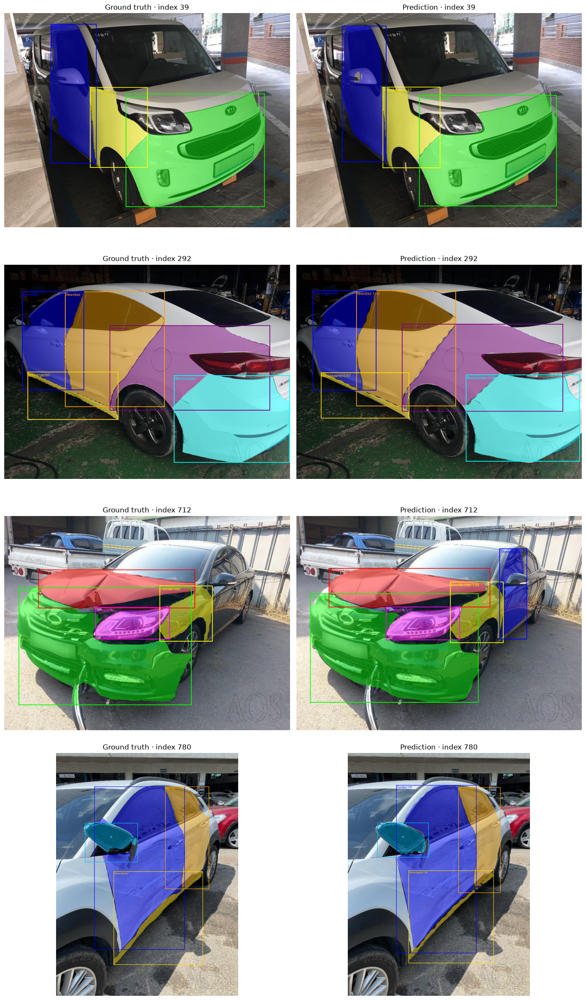

In [107]:
qualitative_indices = random.Random(SEED + 1).sample(
    range(len(datasets["test"])),
    4,
)

fig, axes = plt.subplots(4, 2, figsize=(14, 24))

for row, index in enumerate(qualitative_indices):
    image, target = datasets["test"][index]
    prediction = predict_part_instances(image)

    axes[row, 0].imshow(
        render_annotations(image, target).permute(1, 2, 0)
    )
    axes[row, 0].set_title(f"Ground truth · index {index}")
    axes[row, 0].axis("off")

    axes[row, 1].imshow(
        render_predictions(image, prediction).permute(1, 2, 0)
    )
    axes[row, 1].set_title(f"Prediction · index {index}")
    axes[row, 1].axis("off")

plt.tight_layout()

## External-domain audit

The selected Mask R-CNN checkpoint is evaluated on images from the CarDD and Severity test datasets. These images were not used to train the car-part segmentation model and represent changes in vehicle type, damage level, camera angle, lighting, resolution, and background.

These datasets do not contain car-part ground-truth annotations. Therefore, this section provides a structured qualitative robustness audit rather than COCO metrics.

Before inference, sampled images are screened against the Car Parts dataset for exact and perceptually similar duplicates.

In [108]:
EXTERNAL_SOURCES = {
    "CarDD": PROJECT_ROOT / "data" / "processed" / "cardd" / "test",
    "Severity": PROJECT_ROOT / "data" / "processed" / "severity" / "test",
}

AUDIT_IMAGES_PER_SOURCE = 20
AUDIT_SEED = 42
AUDIT_SCORE_THRESHOLD = 0.5
IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png"}

In [109]:
external_rows = []

for source, directory in EXTERNAL_SOURCES.items():
    image_paths = sorted(path for path in directory.iterdir() if path.suffix.lower() in IMAGE_EXTENSIONS)
    external_rows.extend({"source": source, "image_path": path} for path in image_paths)

external_candidates = pd.DataFrame(external_rows)
external_candidates.groupby("source").size().rename("available_images")

source
CarDD       374
Severity    765
Name: available_images, dtype: int64

###  Select the external audit sample

A deterministic sample of 20 images from each external dataset is selected before examining model predictions.

In [110]:
audit_sample = (
    external_candidates
    .groupby("source", group_keys=False)
    .sample(n=AUDIT_IMAGES_PER_SOURCE, random_state=AUDIT_SEED)
    .sort_values(["source", "image_path"])
    .reset_index(drop=True)
)

audit_sample.insert(0, "audit_id", range(1, len(audit_sample) + 1))
audit_sample.groupby("source").size().rename("selected_images")

source
CarDD       20
Severity    20
Name: selected_images, dtype: int64

### Screen for dataset overlap

Exact SHA-256 hashes and perceptual difference hashes are compared with every processed Car Parts image. Exact matches are excluded. Perceptual matches are flagged for manual inspection because similar hashes do not necessarily prove duplication.

In [111]:
import hashlib

from tqdm import tqdm

In [112]:
CAR_PARTS_ROOT = PROJECT_ROOT / "data" / "processed" / "car_parts"

car_parts_paths = sorted(
    path
    for split in ("train", "validation", "test")
    for path in (CAR_PARTS_ROOT / split).iterdir()
    if path.suffix.lower() in IMAGE_EXTENSIONS
)

len(car_parts_paths)

9083

In [113]:
def sha256_file(path):
    digest = hashlib.sha256()

    with path.open("rb") as file:
        for block in iter(lambda: file.read(1024 * 1024), b""):
            digest.update(block)

    return digest.hexdigest()


def difference_hash(path, hash_size=8):
    with Image.open(path) as image:
        image = image.convert("L").resize((hash_size + 1, hash_size), Image.Resampling.LANCZOS)
        pixels = np.asarray(image)

    bits = pixels[:, 1:] > pixels[:, :-1]
    return int.from_bytes(np.packbits(bits).tobytes(), byteorder="big")

In [114]:
reference_hashes = pd.DataFrame({
    "image_path": car_parts_paths,
    "sha256": [sha256_file(path) for path in tqdm(car_parts_paths, desc="Hashing Car Parts")],
    "difference_hash": [difference_hash(path) for path in tqdm(car_parts_paths, desc="Perceptual hashing")],
})

reference_hashes.shape

Perceptual hashing: 100%|██████████| 9083/9083 [00:27<00:00, 331.64it/s]


(9083, 3)

In [115]:
audit_sample["sha256"] = [
    sha256_file(path)
    for path in tqdm(audit_sample["image_path"], desc="Hashing audit images")
]

audit_sample["difference_hash"] = [
    difference_hash(path)
    for path in tqdm(audit_sample["image_path"], desc="Perceptual hashing")
]

Perceptual hashing: 100%|██████████| 40/40 [00:00<00:00, 201.51it/s]


In [116]:
reference_sha256 = set(reference_hashes["sha256"])
reference_difference_hashes = reference_hashes["difference_hash"].tolist()

audit_sample["exact_match"] = audit_sample["sha256"].isin(reference_sha256)
audit_sample["nearest_hash_distance"] = audit_sample["difference_hash"].map(
    lambda value: min((value ^ reference).bit_count() for reference in reference_difference_hashes)
)
audit_sample["possible_near_match"] = audit_sample["nearest_hash_distance"] <= 4

audit_sample[[
    "audit_id",
    "source",
    "image_path",
    "exact_match",
    "nearest_hash_distance",
    "possible_near_match",
]]

,audit_id,source,image_path,exact_match,nearest_hash_distance,possible_near_match
0,1,CarDD,e:\Projects\DamageLens\data\processed\cardd\te...,False,16,False
1,2,CarDD,e:\Projects\DamageLens\data\processed\cardd\te...,False,16,False
2,3,CarDD,e:\Projects\DamageLens\data\processed\cardd\te...,False,17,False
3,4,CarDD,e:\Projects\DamageLens\data\processed\cardd\te...,False,17,False
4,5,CarDD,e:\Projects\DamageLens\data\processed\cardd\te...,False,12,False
5,6,CarDD,e:\Projects\DamageLens\data\processed\cardd\te...,False,15,False
6,7,CarDD,e:\Projects\DamageLens\data\processed\cardd\te...,False,15,False
7,8,CarDD,e:\Projects\DamageLens\data\processed\cardd\te...,False,14,False
8,9,CarDD,e:\Projects\DamageLens\data\processed\cardd\te...,False,16,False
9,10,CarDD,e:\Projects\DamageLens\data\processed\cardd\te...,False,17,False


### Leakage-screening result

All 40 external images passed screening. No exact matches or likely perceptual duplicates were found against the complete processed Car Parts dataset.

The minimum perceptual-hash distance was 8, above the rejection threshold of 4. The audit sample is therefore retained without replacement.

In [117]:
assert not audit_sample["exact_match"].any()
assert not audit_sample["possible_near_match"].any()

print(f"External images retained: {len(audit_sample):,}")
print(f"Minimum perceptual distance: {audit_sample['nearest_hash_distance'].min()}")

External images retained: 40
Minimum perceptual distance: 8


### Load external images

In [118]:
from torchvision.transforms import functional as TF

In [119]:
def load_external_image(path):
    with Image.open(path) as image:
        return TF.pil_to_tensor(image.convert("RGB")).float() / 255

In [120]:
@torch.inference_mode()
def predict_external_image(path, score_threshold=AUDIT_SCORE_THRESHOLD):
    image = load_external_image(path)
    prediction = model([image.to(DEVICE)])[0]
    keep = prediction["scores"] >= score_threshold

    return {
        "boxes": prediction["boxes"][keep].cpu(),
        "labels": prediction["labels"][keep].cpu(),
        "scores": prediction["scores"][keep].cpu(),
        "masks": prediction["masks"][keep, 0].cpu() >= 0.5,
    }

In [121]:
external_predictions = {}

for row in tqdm(audit_sample.itertuples(), total=len(audit_sample), desc="External inference"):
    external_predictions[row.audit_id] = predict_external_image(row.image_path)

print(f"Completed predictions: {len(external_predictions):,}")

External inference: 100%|██████████| 40/40 [00:03<00:00, 11.24it/s]

Completed predictions: 40


In [122]:
part_names = {
    category["id"]: category["name"]
    for category in datasets["train"].coco.dataset["categories"]
}

In [123]:
prediction_rows = []

for row in audit_sample.itertuples():
    prediction = external_predictions[row.audit_id]
    scores = prediction["scores"]
    labels = prediction["labels"].tolist()

    prediction_rows.append({
        "audit_id": row.audit_id,
        "source": row.source,
        "file_name": row.image_path.name,
        "predictions": len(labels),
        "mean_confidence": scores.mean().item() if len(scores) else np.nan,
        "minimum_confidence": scores.min().item() if len(scores) else np.nan,
        "predicted_parts": ", ".join(part_names[label] for label in labels),
    })

external_summary = pd.DataFrame(prediction_rows)
external_summary

,audit_id,source,file_name,predictions,mean_confidence,minimum_confidence,predicted_parts
0,1,CarDD,000012.jpg,3,0.925283,0.853100,"Wheel, Frontfender, Trunklid"
1,2,CarDD,000175.jpg,1,0.951388,0.951388,Sidemirror
2,3,CarDD,000353.jpg,1,0.998672,0.998672,Wheel
3,4,CarDD,000424.jpg,0,NaN,NaN,
4,5,CarDD,000603.jpg,1,0.997809,0.997809,Wheel
5,6,CarDD,000625.jpg,0,NaN,NaN,
6,7,CarDD,000811.jpg,1,0.716975,0.716975,Bonnet
7,8,CarDD,001058.jpg,1,0.999183,0.999183,Wheel
8,9,CarDD,001267.jpg,1,0.868377,0.868377,Sidemirror
9,10,CarDD,001358.jpg,5,0.971245,0.926824,"Frontfender, Headlights, Frontbumper, Wheel, F..."


In [124]:
external_summary.groupby("source").agg(
    images=("audit_id", "count"),
    images_without_predictions=("predictions", lambda values: (values == 0).sum()),
    average_predictions=("predictions", "mean"),
    average_confidence=("mean_confidence", "mean"),
).round(3)

,images,images_without_predictions,average_predictions,average_confidence
source,,,,
CarDD,20,4,1.3,0.883
Severity,20,16,0.3,0.901


### Visual inspection

Every external audit image is reviewed at the fixed deployment threshold of 0.50. Images without predictions remain included because abstention and missed detections are important external-domain results.

In [125]:
from matplotlib.patches import Rectangle

part_colors = {
    category_id: plt.cm.tab20((category_id - 1) % 20)
    for category_id in part_names
}

In [126]:
def show_external_prediction(axis, row):
    with Image.open(row.image_path) as image:
        image = np.asarray(image.convert("RGB"))

    prediction = external_predictions[row.audit_id]
    axis.imshow(image)

    for box, label, score, mask in zip(
        prediction["boxes"],
        prediction["labels"],
        prediction["scores"],
        prediction["masks"],
    ):
        label = label.item()
        color = part_colors[label]
        x1, y1, x2, y2 = box.tolist()

        overlay = np.zeros((*mask.shape, 4))
        overlay[mask.numpy()] = (*color[:3], 0.35)
        axis.imshow(overlay)

        axis.add_patch(Rectangle(
            (x1, y1),
            x2 - x1,
            y2 - y1,
            fill=False,
            edgecolor=color,
            linewidth=1.5,
        ))

        axis.text(
            x1,
            y1,
            f"{part_names[label]} {score:.2f}",
            color="white",
            fontsize=8,
            bbox={"facecolor": color, "alpha": 0.85, "pad": 1},
        )

    prediction_count = len(prediction["labels"])
    axis.set_title(f"#{row.audit_id} · {row.source}\nPredictions: {prediction_count}", fontsize=10)
    axis.axis("off")

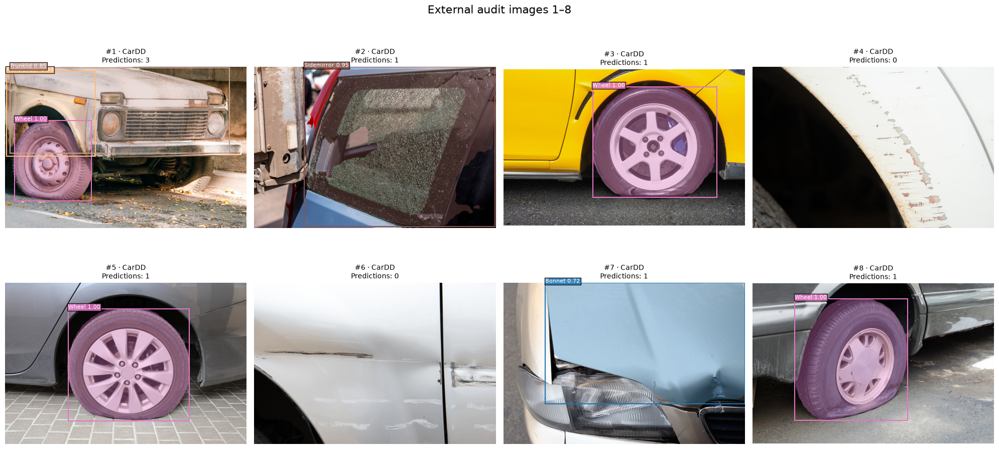

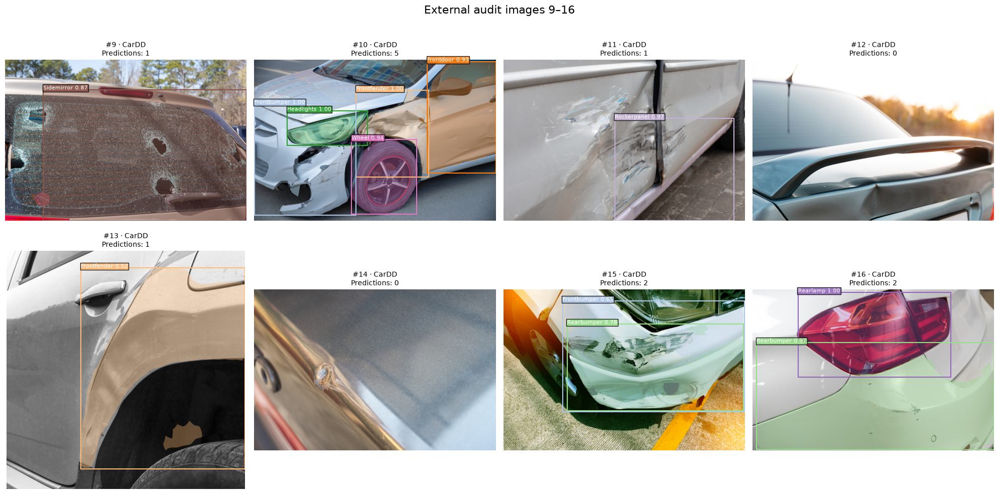

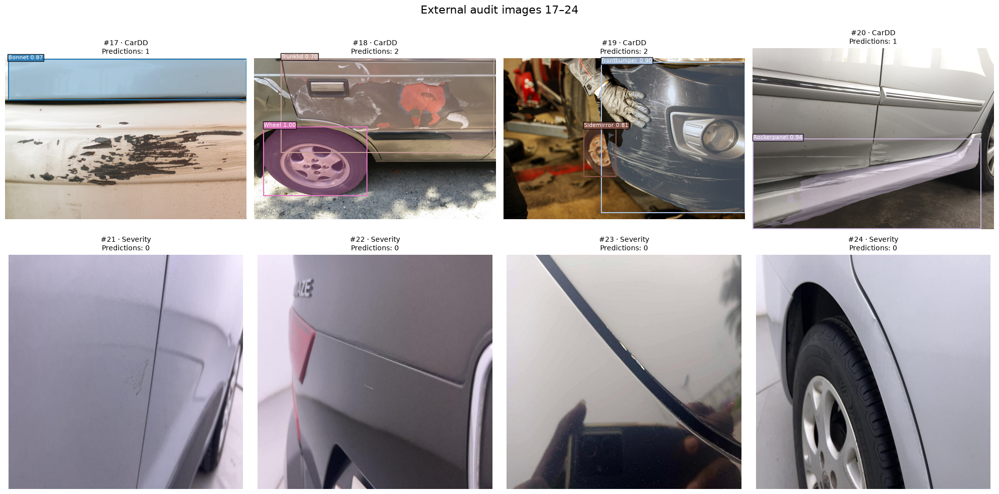

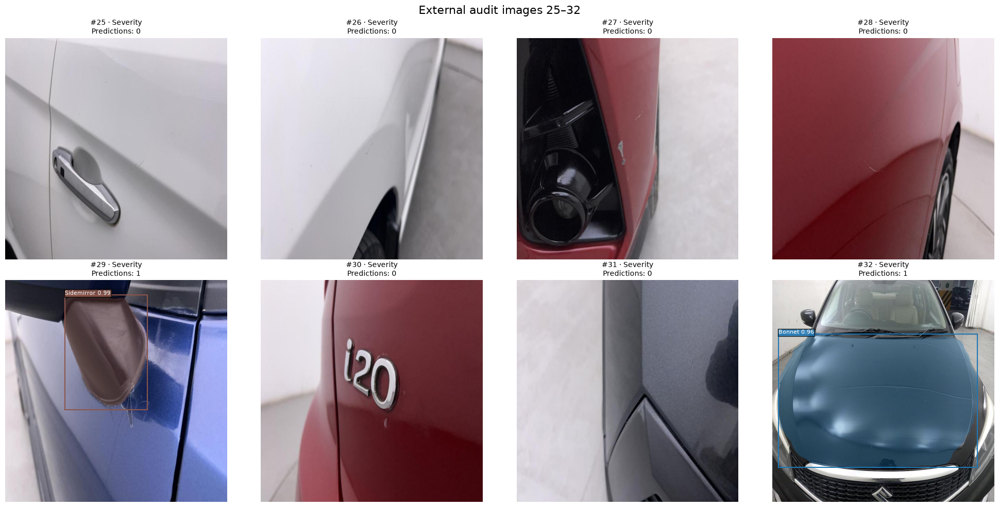

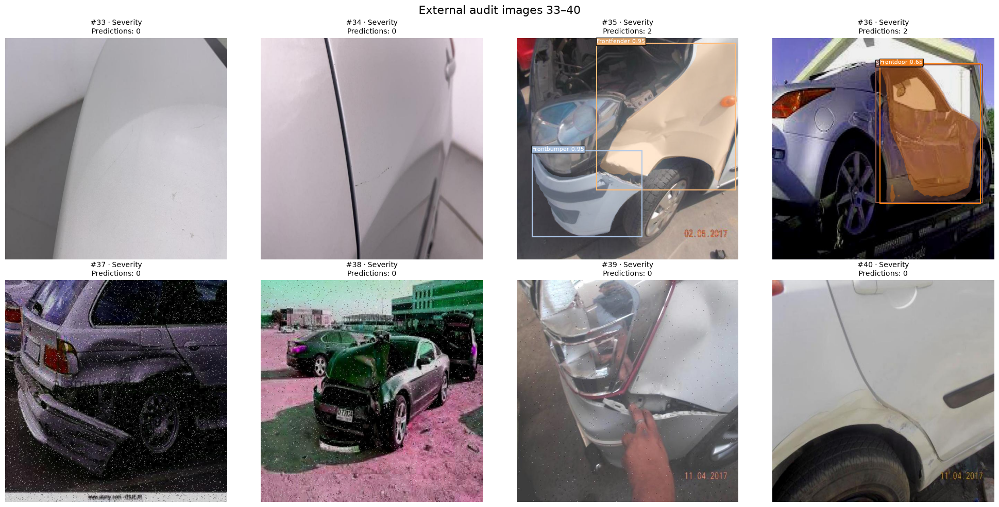

In [127]:
AUDIT_PAGE_SIZE = 8

for start in range(0, len(audit_sample), AUDIT_PAGE_SIZE):
    page = audit_sample.iloc[start:start + AUDIT_PAGE_SIZE]
    figure, axes = plt.subplots(2, 4, figsize=(20, 10))
    axes = axes.ravel()

    for axis, row in zip(axes, page.itertuples()):
        show_external_prediction(axis, row)

    for axis in axes[len(page):]:
        axis.axis("off")

    figure.suptitle(f"External audit images {start + 1}–{start + len(page)}", fontsize=16)
    figure.tight_layout()
    plt.show()

## External audit conclusion

The external audit used 40 deterministic samples: 20 from CarDD and 20 from the Severity dataset. None were exact or likely perceptual duplicates of the processed Car Parts dataset. The minimum perceptual-hash distance was 8, compared with the rejection threshold of 4.

At a confidence threshold of 0.50:

- CarDD produced predictions on 16 of 20 images, with 1.3 predictions per image and mean image-level confidence of 0.883 among detected images.
- Severity produced predictions on 4 of 20 images, with 0.3 predictions per image and mean image-level confidence of 0.901 among detected images.
- Overall, the model produced at least one prediction on 20 of 40 external images.

Visual inspection showed that the model transfers well when a recognizable portion of a complete car part is visible. Wheels, bumpers, bonnets, rocker panels, and some larger body panels were often segmented accurately despite changes in vehicle type, damage, lighting, and background.

Performance decreased substantially on tightly cropped damage images. These images frequently omit the full shape and surrounding context of the affected part. Some abstentions were therefore reasonable, but genuine missed detections were also observed. A small number of high-confidence classification errors and false positives demonstrate that confidence alone cannot guarantee correctness outside the training distribution.

The Severity dataset is not a direct quantitative benchmark for this model because it has no car-part ground truth and contains a different image-framing distribution. Its value here is as a stress test for domain shift.

### Model decision

The epoch-9 checkpoint is retained as the selected car-part segmentation model. Its in-domain test performance remains strong:

- Bounding-box mAP: 0.776
- Bounding-box AP50: 0.870
- Segmentation-mask mAP: 0.772
- Segmentation-mask AP50: 0.868

The model is suitable for the DamageLens showcase when the inspection workflow requests wider vehicle or part-level photographs. It should not be presented as reliable for arbitrary extreme close-ups.

Future improvements should include close-up part examples, harder negative samples, confidence calibration on external data, and an independently labelled external car-part test set. Until then, external-audit results should be reported as qualitative evidence with clear limitations rather than as accuracy measurements.